# Plot ensemble mean performance of models for comparison.


In [16]:
import numpy as np
import matplotlib.pyplot as plt
import os
from collections import defaultdict
from ensembleUtils import Evaluator
import seaborn as sns
import pandas as pd
from scipy.stats import variation,zscore
import math
from scipy.stats import gaussian_kde
import matplotlib.ticker as ticker
import geopandas as gpd
from matplotlib import colors as cm

## Load simulation results and calculate metrics

In [17]:
rootDir = '../checkpoints/ensemble'
meanOpt = True  # determine whether plot mean performance for ET and snow depth
modelNames = ['wLAI=0', 'wLAI=0.5', 'wLAI=1']
stations = ['TNH', 'JUG', 'MAQ', 'MET', 'JIM']
#  initiate a dict to store NSE, r, and PBIAS of streamflow, r and RMSE of ET and snow depth for five models
modelMetric, simulation, valData = dict(), dict(), dict()
for model in modelNames:
    print(f'Calculating metrics for model {model}')
    modelDir = os.path.join(rootDir, model)
    evaluator = Evaluator(ensembleFolder=modelDir,
                          basinFile='../data/sub-basins/watershed.shp',
                          flowFile='../data/streamflow.csv',
                          valDataFile='../data/valData.pkl',
                          LAIFile='../data/LAI.csv')
    modelMetric[model] = evaluator.metric
    valData[model] = evaluator.valData
    simulation[model] = evaluator.sim

Calculating metrics for model wLAI=0
Calculating metrics for model wLAI=0.5
Calculating metrics for model wLAI=1
Calculating metrics for model wLAI=0
Calculating metrics for model wLAI=0.5
Calculating metrics for model wLAI=1


### Plot ensemble mean metrics for streamflow

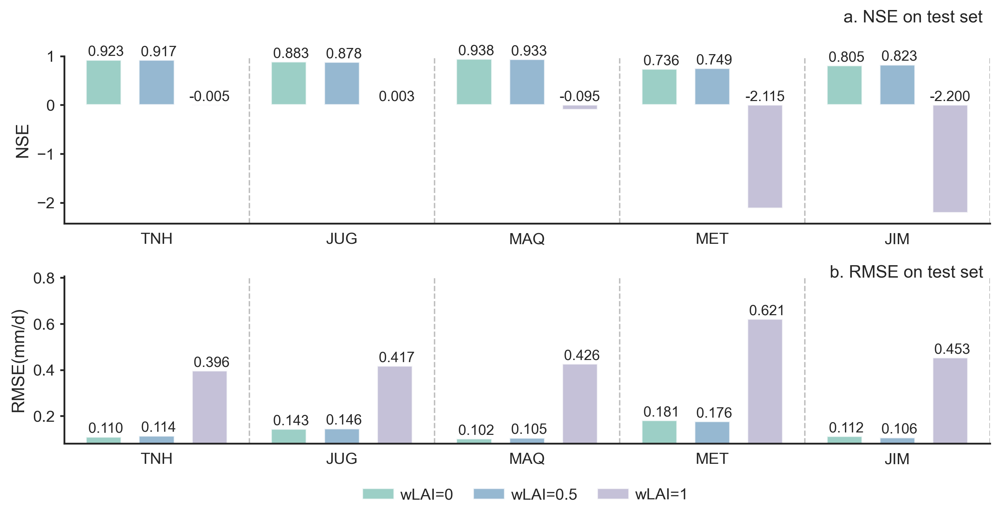

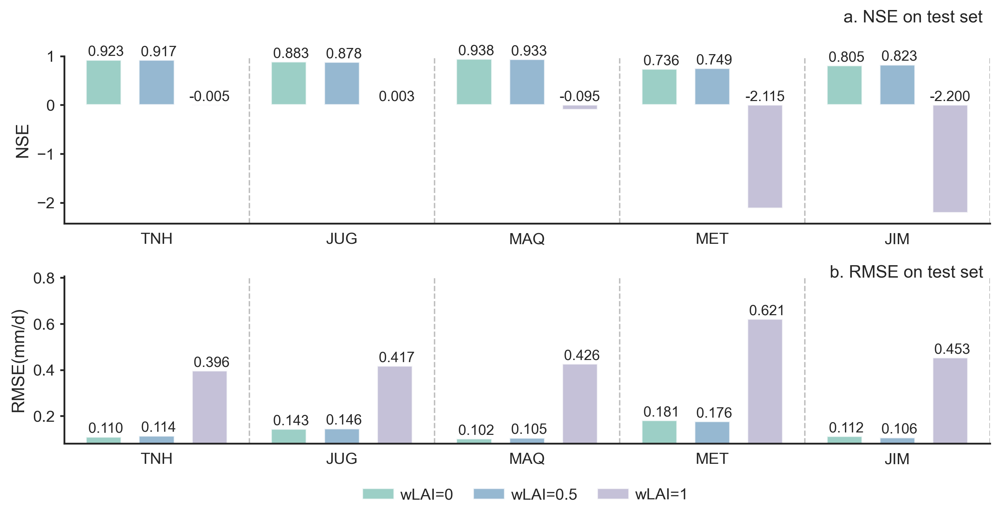

In [18]:
plt.rcParams['font.family'] = 'Arial'
sns.set(style="ticks")

def auto_text(rects, ax, metric):
    for rect in rects:
        height = rect.get_height()
        if height > 0:
            xy=(rect.get_x() + rect.get_width() / 2, height)
        else:
            xy=(rect.get_x() + rect.get_width() / 2, 0)

        text = f'{height: .1f}' if metric in ['PBIAS'] else f'{height: .3f}'
        ax.annotate(text,  # put the detail data
                    xy=xy,  # get the center location.
                    xytext=(0, 1),
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=10)

fig = plt.figure(figsize=(10, 5), dpi=300)
metricUnit = dict(zip(['NSE', 'RMSE'], ['', '(mm/d)']))

# 'x' indicates temporal test station, '+' indicates spatial test stations, nts stands for number of training stations
markers = {'TNH': 'T', 'MAQ': 'T', 'JIM': 'T', 'HHY': 'S', 'MET': 'S', 'JUG': 'S'}
color_dict = dict(zip(['wLAI=0', 'wLAI=0.5', 'wLAI=1'], ['#84C3B7', '#7DA6C6', '#B7B2D0']))

for i, metricName in enumerate(metricUnit.keys()):
    yMax, yMin = -9999, 9999
    ax = fig.add_subplot(2, 1, i + 1)
    boxes = defaultdict()
    space, width = 0.1, 0.2
    for k, station in enumerate(stations):
        for j, model in enumerate(color_dict.keys()):
            xTemp = np.array([(space + width) * (0.5 + j + k * 3) + space * k * 1.5])
            yTemp = np.array([modelMetric[model]['Q']['mean'][station][metricName]])
            yMax = yTemp.max() if yTemp.max() > yMax else yMax
            yMin = yTemp.min() if yTemp.min() < yMin else yMin
            rect = ax.bar(xTemp, yTemp, width, color=color_dict[model], label=model, alpha=0.8)
            auto_text(rect, ax, metricName)

    # ax.set_xlabel(station, labelpad=2.5)
    top = min(yMax * 1.6, 1.0) if metricName in ['NSE', 'r', 'KGE'] else yMax * 1.3
    bottom = yMin * 0.8 if yMin > 0 else yMin * 1.1
    ax.set_ylim(top=top, bottom=bottom)
    xticks = [(space + width) * (0.5 + 1 + k * 3) + space * k * 1.5 for k in range(len(stations))]
    ax.set_xticks(xticks)
    ax.set_xticklabels(stations)

    # add scatter plot
    for k, station in enumerate(stations):
        for j, model in enumerate(color_dict.keys()):
            xScatter = (space + width) * (0.5 + j + k * 3) + space * k * 1.5
            # yScatter = modelMetric[model]['Q']['mean'][station][metricName]
            # yScatter = (yScatter - max(bottom, 0)) * 0.5 + max(bottom, 0)
            # ax.annotate(markers[station], xy=(xScatter, yScatter), xytext=(0, -1.5), ha='center', va='center', fontsize=8, color='black', textcoords='offset points')
            if j == 2:
                ax.axvline(x=xScatter + 1.25 * space + width / 2, color='grey', linestyle='--', alpha=0.5, linewidth=1)

    ax.tick_params(axis='y', length=3)  # adjust tick length
    ax.tick_params(axis='x', length=3, color='white')  # adjust tick length
    ax.set_ylabel(metricName + metricUnit[metricName])
    ax.set_xlim(left=xticks[0] - 1.5 * (width + space) - 0.75 * space, right=xticks[-1] + 1.5 * (width + space) + 0.75 * space)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    # ax.grid(axis='y',ls='--',alpha=0.8)
    if i == 0:
        ax.annotate(f'{chr(97 + i)}. {metricName} on test set ', xy=(0.842, 1.2), xycoords='axes fraction')
    else:
        ax.annotate(f'{chr(97 + i)}. {metricName} on test set ', xy=(0.827  , 0.99), xycoords='axes fraction')

lines, labels = ax.get_legend_handles_labels()
fig.legend(lines[:3], labels[:3], ncol=3, borderaxespad=0.1,
           bbox_to_anchor=(0.35, 0.03, 0.33, 0.02), mode='expand', columnspacing=1, frameon=False, handletextpad=0.4)

# ax.annotate('T: Temporal test station   S: Spatial test station', xy=(0.5, 0.02), xycoords='figure fraction', ha='center', fontsize=10)

fig.tight_layout(rect=(0, 0.04, 1, 1))

In [19]:
def evalFn(true: np.ndarray, pred: np.ndarray):
    # calculate nse
    numerator = np.sum((pred - true) ** 2)
    denominator = np.sum((true - np.mean(true)) ** 2)
    nse = 1 - numerator / denominator
    # calculate pearson's correlation coefficient
    r = np.corrcoef(pred, true)[0, 1]
    # calculate the percent bias
    pBias = 100 * (pred - true).sum() / true.sum()
    # calculate KGE
    beta = np.mean(pred) / np.mean(true)
    gamma = (np.std(pred) / np.mean(pred)) / (np.std(true) / np.mean(true))
    kge = 1 - np.sqrt((r - 1) ** 2 + (beta - 1) ** 2 + (gamma - 1) ** 2)
    # calculate RMSE
    rmse = np.sqrt(np.mean((pred - true) ** 2))
    # calculate log nse
    predLog, trueLog = np.log10(pred + 0.1), np.log10(true + 0.1)
    numerator = np.sum((predLog - trueLog) ** 2)
    denominator = np.sum((trueLog - np.mean(trueLog)) ** 2)
    nseLog = 1 - numerator / denominator
    return nse, r, pBias, kge, rmse, nseLog

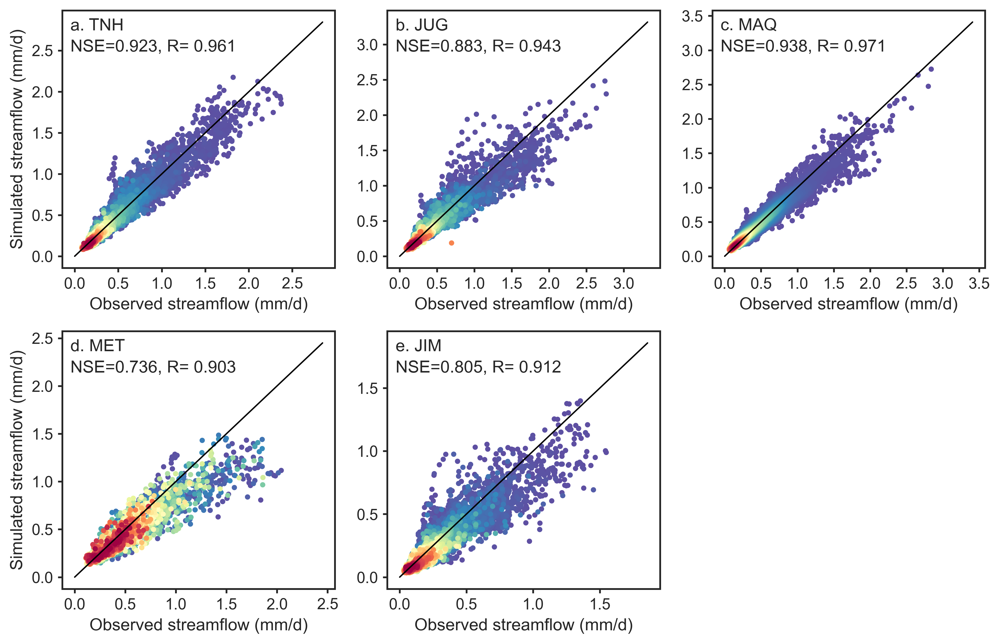

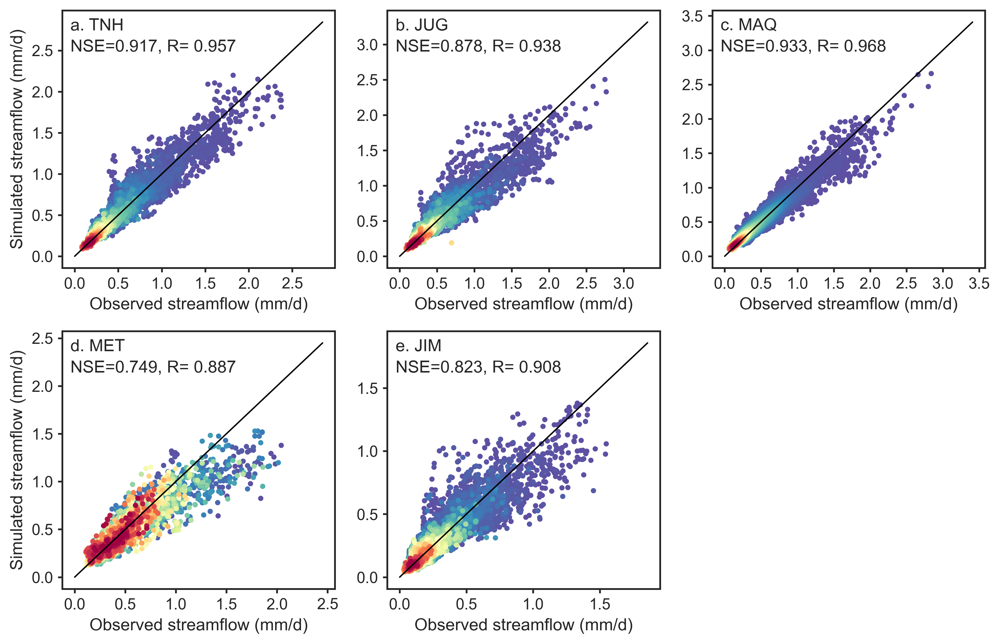

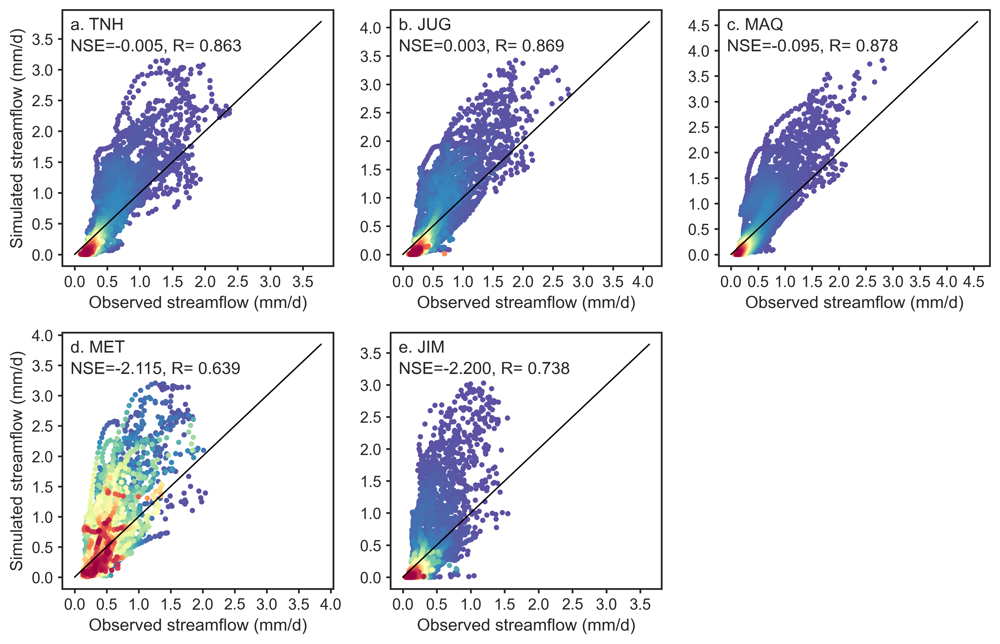

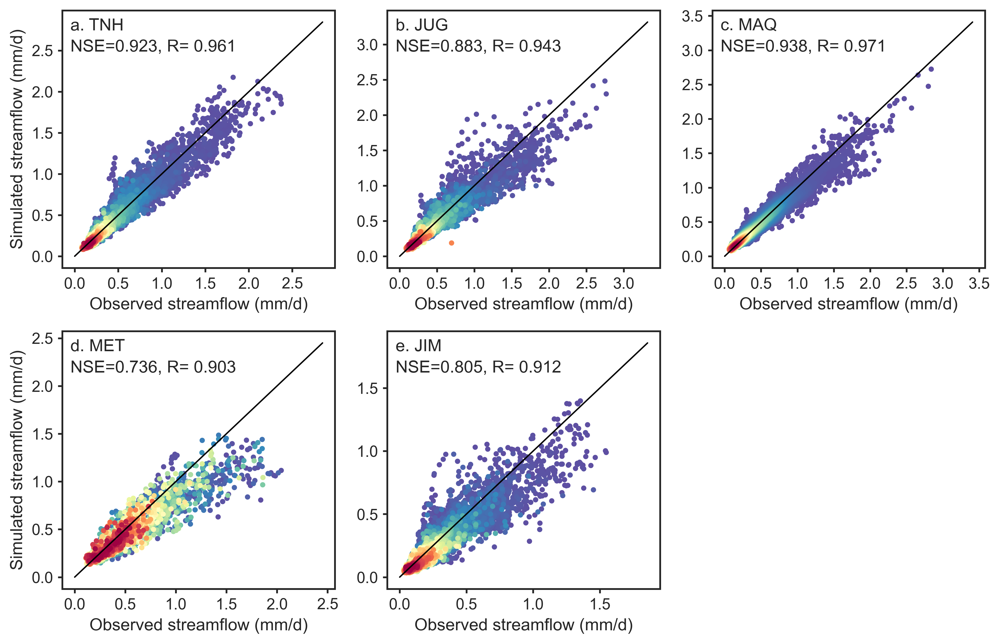

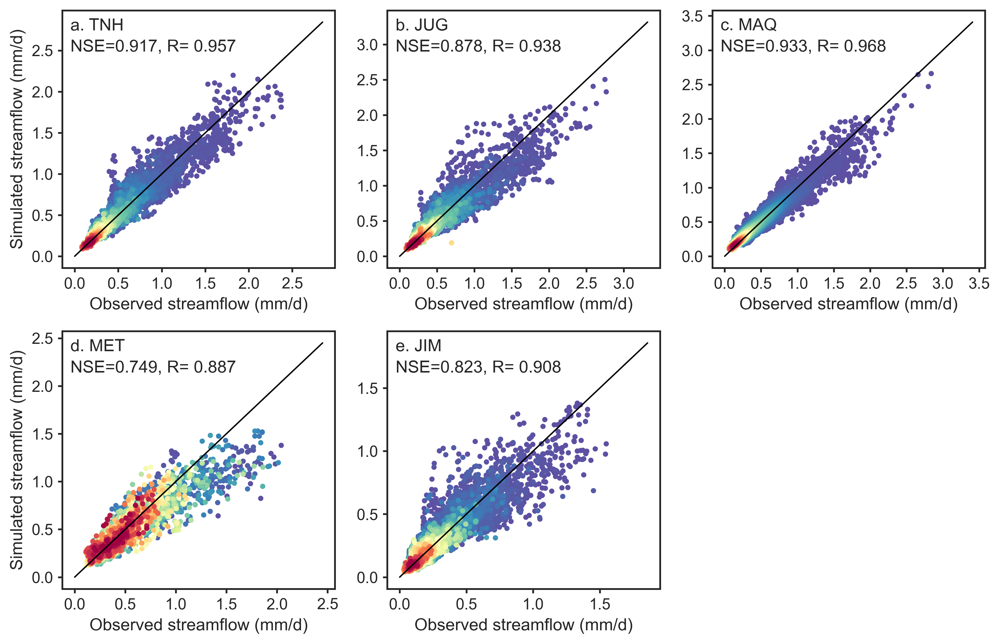

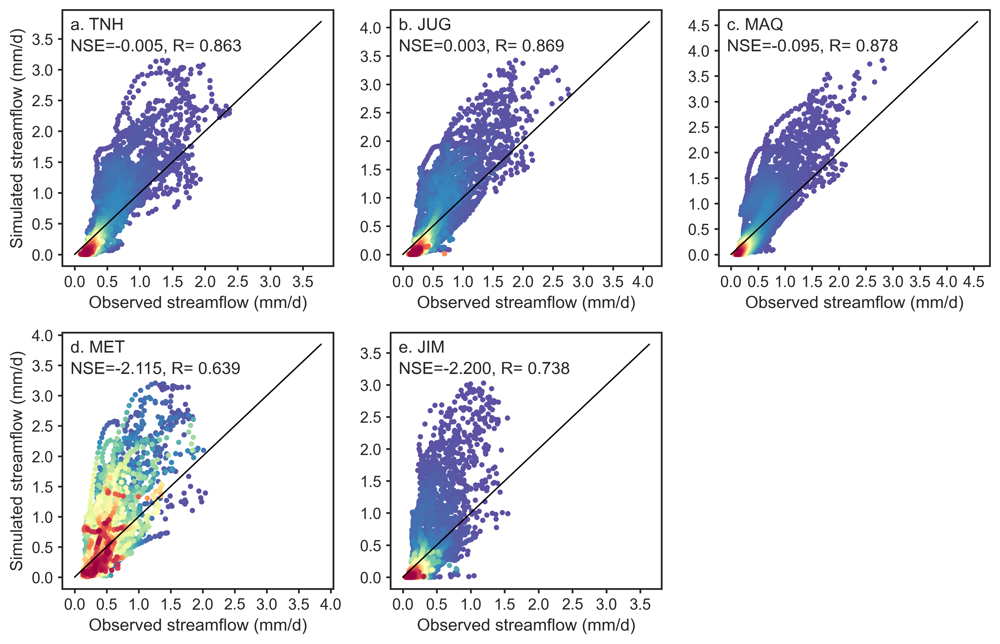

In [20]:
# set seaborn style
custom_params = {
    'xtick.major.size': 3,
    'ytick.major.size': 3,
}
sns.set_theme(style='ticks', rc=custom_params)

# plot scatters for streamflow
for model in color_dict.keys():
    tst_period = pd.date_range('2005-1-1', '2019-12-31')
    area = {'HHY': 20930, 'JIM': 45019, 'JUG': 98414, 'MAQ': 86048, 'MET': 59655, 'TNH': 121972}

    # get ensemble mean simulated streamflow
    sim_Q = simulation[model]['mean']['Qr'].loc[:, [13, 45, 53, 35, 23, 0]]
    sim_Q.rename(columns={13: 'HHY', 45: 'JIM', 53: 'MET', 35: 'MAQ', 23: 'JUG', 0: 'TNH'}, inplace=True)
    sim_Q = sim_Q[sim_Q.index.isin(tst_period)]
    # get observed streamflow
    obs_Q = pd.read_csv('../data/streamflow.csv', index_col='DATE', parse_dates=True)
    obs_Q = obs_Q[obs_Q.index.isin(tst_period)]

    # plot scatters
    fig = plt.figure(figsize=(10, 6.5), dpi=400)
    for i, station in enumerate(stations):
        unit = 24 * 3600 / (area[station] * 1000)
        pred, true = sim_Q.loc[:, station] * unit, obs_Q.loc[:, station] * unit
        if station == 'MET':
            pred = pred[(pred.index.month >= 5) & (pred.index.month <= 10)]
            true = true[(true.index.month >= 5) & (true.index.month <= 10)]
        # drop nan value
        pred.name, true.name = 'pred', 'true'
        dfTemp = pd.concat([pred, true], axis=1)
        dfTemp.dropna(inplace=True)
        nse, r, pbias, kge, rmse, nseLog = evalFn(true=dfTemp['true'].values, pred=dfTemp['pred'].values)

        # plot scatters
        ax = fig.add_subplot(2, 3, i+1)
        x, y = dfTemp['true'].values, dfTemp['pred'].values
        xy = np.vstack([x, y])
        z = gaussian_kde(xy)(xy)
        idx = z.argsort()
        x_plot, y_plot, z_plot = true[idx], pred[idx], z[idx]
        ylim_max = max(x_plot.max(), y_plot.max())
        ax.plot(np.linspace(0, ylim_max * 1.2), np.linspace(0, ylim_max * 1.2), color='black', lw=1) # 1:1 line
        scatter = ax.scatter(x_plot, y_plot, c=z_plot, edgecolors=['None'], s=14, cmap='Spectral_r')

        # adjust format
        if i % 3 == 0:
            ax.set_ylabel('Simulated streamflow (mm/d)')
        ax.set_xlabel('Observed streamflow (mm/d)')
        ax.xaxis.set_major_locator(ticker.MultipleLocator(0.5))
        ax.yaxis.set_major_locator(ticker.MultipleLocator(0.5))

        # annotation
        text = f'{chr(97+i)}. {station}\nNSE={nse:.3f}, R={r: .3f}'
        ax.annotate(text, xy=(0.03, 0.84), xycoords='axes fraction', linespacing=1.5)

        plt.tight_layout()

## Plot ensemble mean metrics for LAI

In [21]:
from matplotlib.colors import LinearSegmentedColormap

# Get YellowGreen color map
cmap_spectral = plt.get_cmap('Spectral')
N = cmap_spectral.N
colors_spectral = cmap_spectral(np.linspace(0, 1, N))
mid_point = N // 2
yeGr = colors_spectral[mid_point:]
yeGr = LinearSegmentedColormap.from_list('YellowGreen', yeGr)

# Get YellowRed color map
cmap_spectral = plt.get_cmap('Spectral_r')
N = cmap_spectral.N
colors_spectral = cmap_spectral(np.linspace(0, 1, N))
mid_point = N // 2
yeRed = colors_spectral[mid_point:]
yeRed = LinearSegmentedColormap.from_list('YellowRed', yeRed)

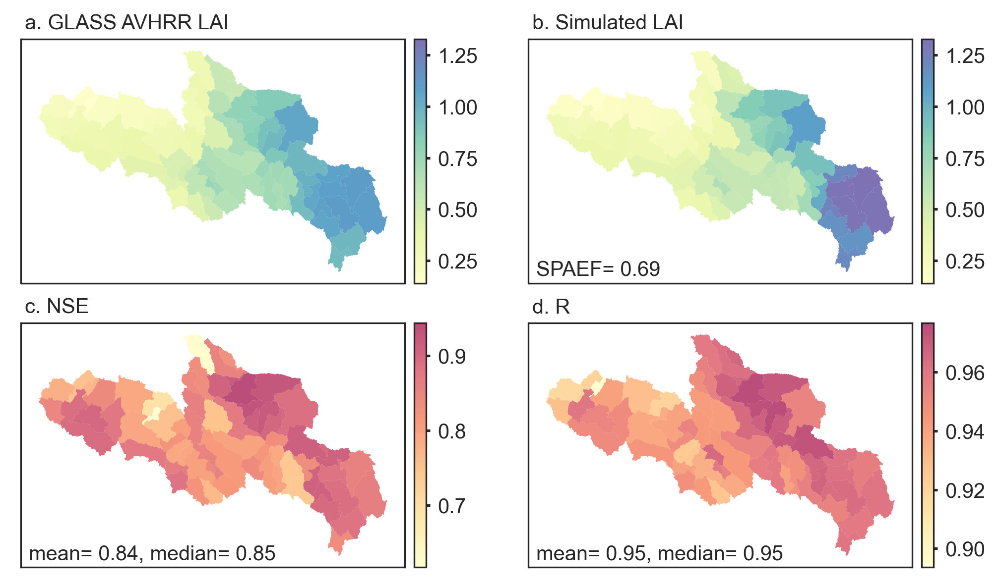

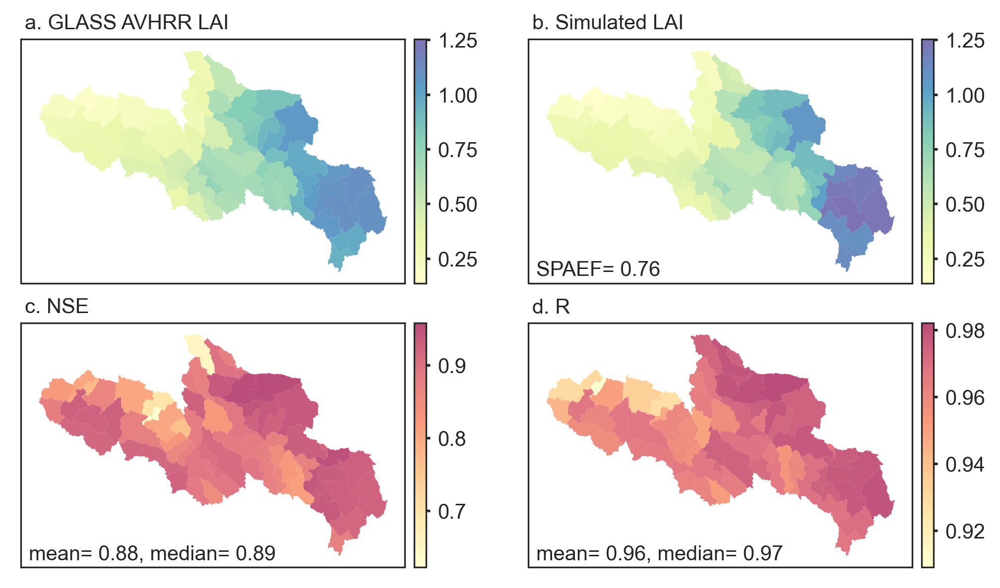

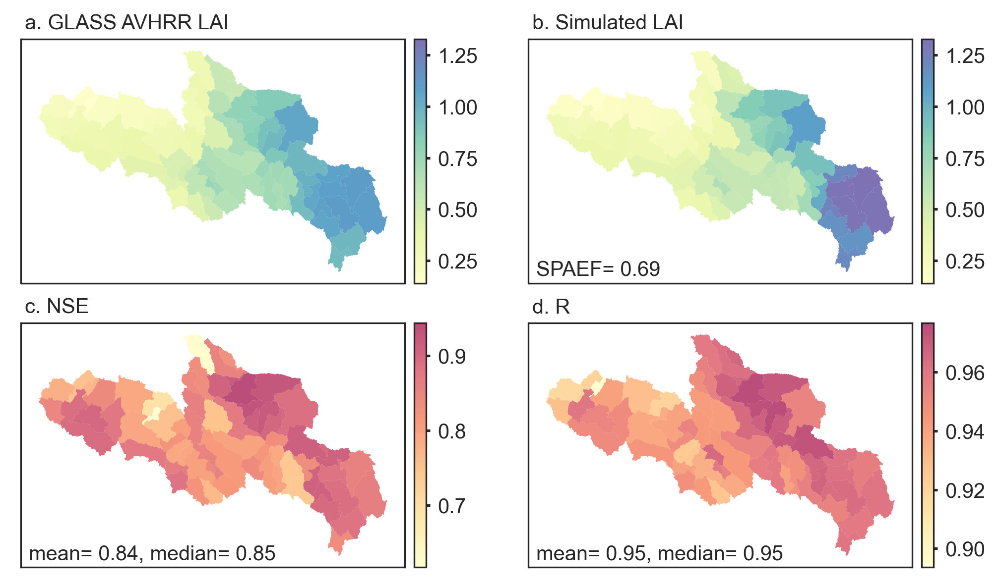

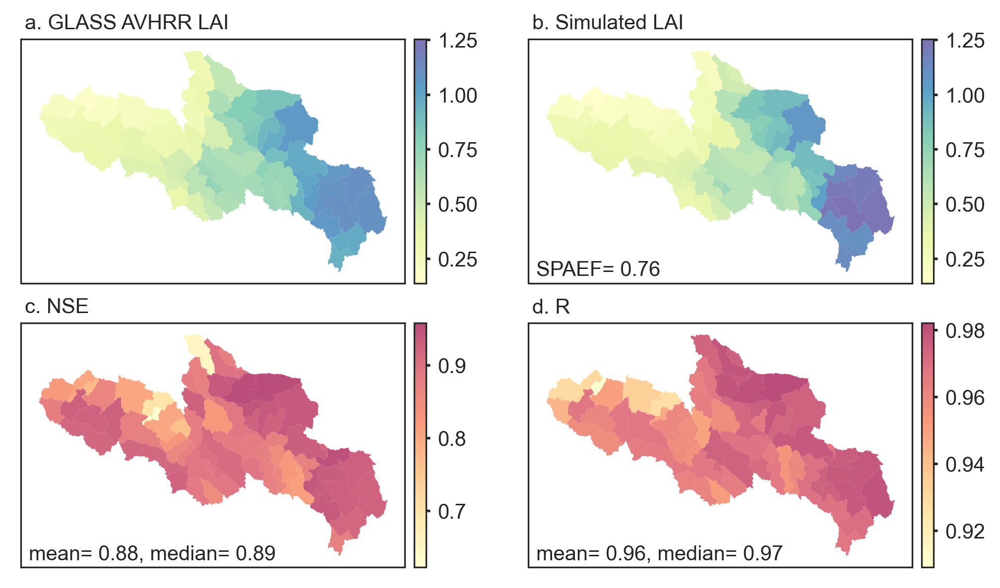

In [22]:
basins = gpd.read_file('../data/sub-basins/watershed.shp')
for model in ['wLAI=0.5', 'wLAI=1']:
    # get observed LAI
    tst_period = pd.date_range('2005-1-1', '2018-12-31')
    df_obs = pd.read_csv('../data/LAI.csv', index_col=0, header=0, parse_dates=True)
    df_obs = df_obs[df_obs.index.isin(tst_period)]

    # resample simulated LAI to match the observed LAI
    sim_LAI = simulation[model]['mean']['LAI']
    sim_LAI.rename(columns={i: f'basin_{i}' for i in range(0, 69)}, inplace=True)
    df_sim = pd.DataFrame(index=df_obs.index, columns=df_obs.columns, dtype='float')
    for i in range(len(df_obs.index)):
        if i == len(df_obs.index) - 1:
            start_date = df_obs.index[i]
            df_sim.loc[start_date] = sim_LAI.loc[start_date:, :].mean(axis=0)
        else:
            start_date = df_obs.index[i]
            end_date = df_obs.index[i + 1]
            df_sim.loc[start_date] = sim_LAI.loc[start_date:end_date, :].mean(axis=0)

    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(7, 4), dpi=300)

    # calculate data to plot
    basins.loc[:, 'GLASS AVHRR LAI'] = df_obs.mean(axis=0).values
    basins.loc[:, 'Simulated LAI'] = df_sim.mean(axis=0).values
    basins.loc[:, 'NSE'] = modelMetric[model]['LAI']['mean']['NSE']
    basins.loc[:, 'R'] = modelMetric[model]['LAI']['mean']['R']

    for j, item in enumerate(['GLASS AVHRR LAI', 'Simulated LAI', 'NSE', 'R']):
        cmap = yeGr if j < 2 else yeRed
        ax = axes[j//2, j%2]
        if item in ['GLASS AVHRR LAI', 'Simulated LAI']:
            vmin = min(basins.loc[:, 'GLASS AVHRR LAI'].min(), basins.loc[:, 'Simulated LAI'].min())
            vmax = max(basins.loc[:, 'GLASS AVHRR LAI'].max(), basins.loc[:, 'Simulated LAI'].max())
            basins.plot(column=item, ax=ax, cmap=cmap, edgecolor='None', linewidth=0.1, vmin=vmin, vmax=vmax, alpha=0.8)
        else:
            vmin, vmax = basins.loc[:, item].values.min(), basins.loc[:, item].values.max()
            basins.plot(column=item, ax=ax, cmap=cmap, edgecolor='None', linewidth=0.1, vmin=vmin, vmax=vmax, alpha=0.7)

        ax.set_xticks([])
        ax.set_yticks([])

        # Set axis spines properties
        lw = 0.8
        ax.spines['top'].set_linewidth(lw)  # Top spine thickness
        ax.spines['bottom'].set_linewidth(lw)  # Bottom spine thickness
        ax.spines['left'].set_linewidth(lw)  # Left spine thickness
        ax.spines['right'].set_linewidth(lw)  # Right spine thickness

        ax.annotate(f'{chr(97+j)}. {item}', xy=(0.01, 1.04), xycoords='axes fraction', fontsize=10)
        # calculate spatial similarity
        if item == 'Simulated LAI':
            obs, sim = basins.loc[:, 'GLASS AVHRR LAI'].values, basins.loc[:, item].values
            alpha = np.corrcoef(obs, sim)[0, 1]
            beta = variation(sim) / variation(obs)
            bins = int(np.around(math.sqrt(len(obs)), 0))
            hobs, _ = np.histogram(zscore(obs),bins)
            hsim, _ = np.histogram(zscore(sim),bins)
            gamma = np.minimum(hobs, hsim).sum() / hobs.sum()
            spaEF = 1 - np.sqrt((alpha - 1) ** 2 + (beta - 1) ** 2 + (gamma - 1) ** 2)
            ax.annotate(f'SPAEF={spaEF: .2f}', xy=(0.02, 0.03), xycoords='axes fraction', fontsize=10)
        elif item in ['NSE', 'R']:
            mean, median = basins.loc[:, item].mean(), basins.loc[:, item].median()
            ax.annotate(f'mean={mean: .2f}, median={median: .2f}', xy=(0.02, 0.03), xycoords='axes fraction', fontsize=10)
        norm = cm.Normalize(vmin=vmin, vmax=vmax)
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        if item in ['GLASS AVHRR LAI', 'Simulated LAI']:
            cbar = plt.colorbar(sm, ax=ax, orientation='vertical', shrink=1, pad=0.02, alpha=0.8)
        else:
            cbar = plt.colorbar(sm, ax=ax, orientation='vertical', shrink=1, pad=0.02, alpha=0.7)

        cbar.ax.tick_params(direction='out', length=2, labelsize=10)
        cbar.outline.set_linewidth(lw)

    plt.subplots_adjust(wspace=0.05, hspace=0.01)
    plt.tight_layout()

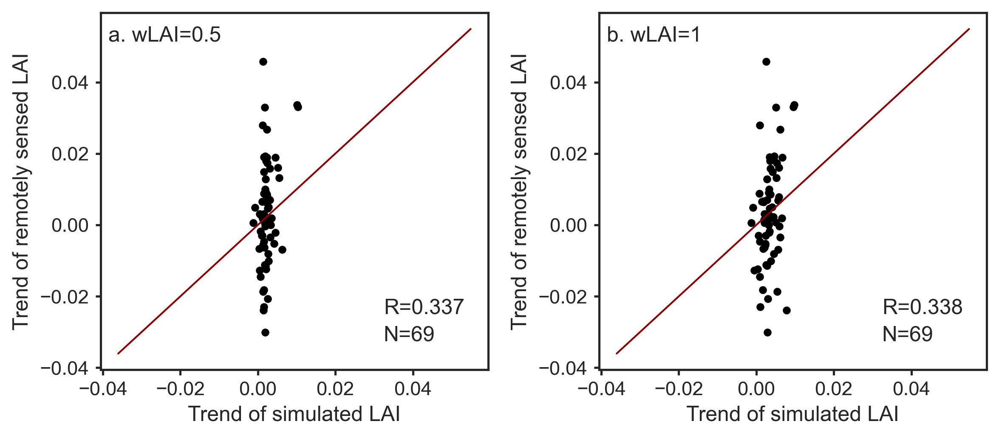

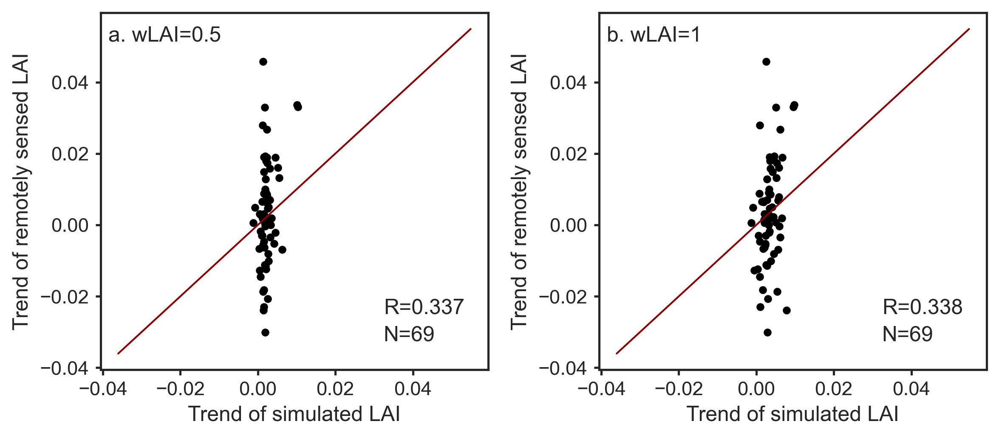

In [23]:
# evaluate the simulation of LAI trends
import pymannkendall as mk

fig = plt.figure(figsize=(8, 3.6), dpi=300)
for num, model in enumerate(['wLAI=0.5', 'wLAI=1']):
    # get observed LAI
    tst_period = pd.date_range('2005-1-1', '2018-12-31')
    df_obs = pd.read_csv('../data/LAI.csv', index_col=0, header=0, parse_dates=True)
    df_obs = df_obs[df_obs.index.isin(tst_period)]

    # resample simulated LAI to match the observed LAI
    sim_LAI = simulation[model]['mean']['LAI']
    sim_LAI.rename(columns={i: f'basin_{i}' for i in range(0, 69)}, inplace=True)
    df_sim = pd.DataFrame(index=df_obs.index, columns=df_obs.columns, dtype='float')
    for i in range(len(df_obs.index)):
        if i == len(df_obs.index) - 1:
            start_date = df_obs.index[i]
            df_sim.loc[start_date] = sim_LAI.loc[start_date:, :].mean(axis=0)
        else:
            start_date = df_obs.index[i]
            end_date = df_obs.index[i + 1]
            df_sim.loc[start_date] = sim_LAI.loc[start_date:end_date, :].mean(axis=0)
    # # get mean growing season LAI for growing
    # df_gs_sim = df_sim[(df_sim.index.month >= 5) & (df_sim.index.month <= 10)]
    # df_gs_obs = df_obs[(df_obs.index.month >= 5) & (df_obs.index.month <= 10)]
    # y_sim = df_gs_sim.groupby(df_gs_sim.index.year).mean()
    # y_obs = df_gs_obs.groupby(df_gs_obs.index.year).mean()
    # get max LAI for each year
    y_sim = df_sim.groupby(df_sim.index.year).max()
    y_obs = df_obs.groupby(df_obs.index.year).max()

    # calculate M-K trend
    trend_sim, trend_obs = [], []
    for col in y_sim.columns:
        trend_sim.append(mk.original_test(y_sim.loc[:, col].values)[7])
        trend_obs.append(mk.original_test(y_obs.loc[:, col].values)[7])
    trend_sim, trend_obs = np.array(trend_sim), np.array(trend_obs)
    r = np.corrcoef(trend_sim, trend_obs)[0, 1]
    # plot scatters
    ax = fig.add_subplot(1, 2, num+1)
    ylim_max, ylim_min = max(trend_sim.max(), trend_obs.max()), min(trend_sim.min(), trend_obs.min())
    ax.plot(np.linspace(ylim_min*1.2, ylim_max * 1.2), np.linspace(ylim_min*1.2, ylim_max * 1.2), color='darkred', lw=1) # 1:1 line
    ax.scatter(trend_sim, trend_obs, c='black', s=12)
    ax.set_xlabel('Trend of simulated LAI')
    ax.set_ylabel('Trend of remotely sensed LAI')
    ax.annotate(f'R={r:.3f}\nN=69', xy=(0.73, 0.08), xycoords='axes fraction', linespacing=1.5)
    ax.annotate(f'{chr(97+num)}. {model}', xy=(0.02, 0.92), xycoords='axes fraction')
fig.tight_layout()

### Plot box diagram for ET and snow depth

['wLAI=0: median R: 0.891, mean R: 0.892', 'wLAI=0.5: median R: 0.913, mean R: 0.908', 'wLAI=1: median R: 0.868, mean R: 0.871']
['wLAI=0: median RMSE: 0.470, mean RMSE: 0.467', 'wLAI=0.5: median RMSE: 0.377, mean RMSE: 0.387', 'wLAI=1: median RMSE: 0.385, mean RMSE: 0.392']


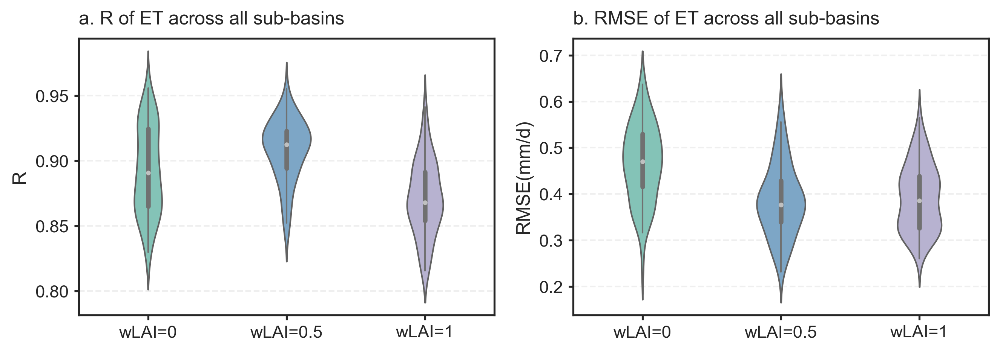

['wLAI=0: median R: 0.891, mean R: 0.892', 'wLAI=0.5: median R: 0.913, mean R: 0.908', 'wLAI=1: median R: 0.868, mean R: 0.871']
['wLAI=0: median RMSE: 0.470, mean RMSE: 0.467', 'wLAI=0.5: median RMSE: 0.377, mean RMSE: 0.387', 'wLAI=1: median RMSE: 0.385, mean RMSE: 0.392']


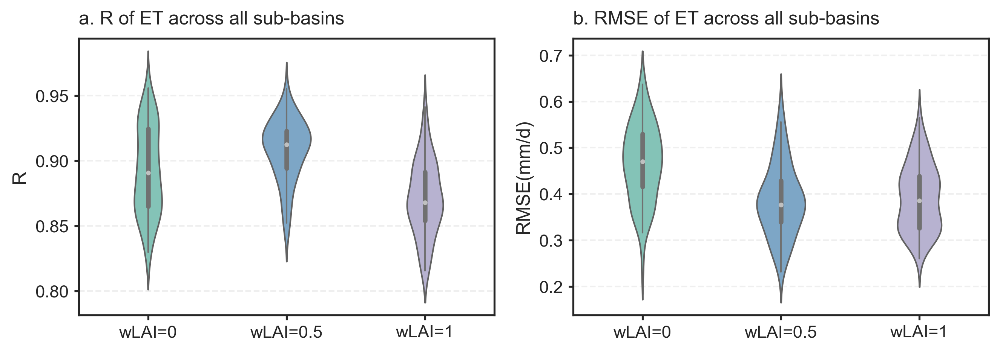

In [24]:
fig = plt.figure(figsize=(9, 3.5), dpi=300)
models = ['wLAI=0', 'wLAI=0.5', 'wLAI=1']
palette = sns.color_palette(list(color_dict.values()))

for i, metricName in enumerate(['R', 'RMSE']):
    for k, var in enumerate(['ET']):
        axNum = i + 2 * k + 1
        ax = fig.add_subplot(1, 2, axNum)
        yTemp = [modelMetric[model][var]['mean'][metricName] for model in models]
        yTemp = [y[~np.isnan(y.astype('float'))] for y in yTemp]
        txt = [f'{models[l]}: median {metricName}: {np.median(yTemp[l]):.3f}, mean {metricName}: {np.mean(yTemp[l]):.3f}' for l in range(len(models))]
        print(txt)
        violins = sns.violinplot(yTemp, palette=palette, width=0.35, linewidth=1, inner='box', linecolor='lightgrey', fill=False, saturation=1, ax=ax)
        for num in range(len(models)):  # change the color of inner box
            c = '#707070'
            ax.get_children()[4*num+1].set_color(c)
            ax.get_children()[4*num+2].set_color(c)
            ax.get_children()[4*num+3].set_edgecolor('silver')
            ax.get_children()[4*num+3].set_facecolor('silver')
        ax.set_xticklabels(models)
        metricUnit = dict(zip(['R', 'RMSE'], ['', '(mm/d)'])) if var == 'ET' else dict(zip(['R', 'RMSE'], ['', '(mm)']))
        ax.set_ylabel(metricName.upper() + metricUnit[metricName])
        # ax.set_ylim(top=1 if metricName == 'R' else 1.8)
        if i == 0:
            textVar = var.lower() if var == 'Snow depth' else var
            ax.annotate(f'{chr(97+i+2*k)}. R of {textVar} across all sub-basins', xy=(0.0, 1.05), xycoords='axes fraction')
        else:
            textVar = var.lower() if var == 'Snow depth' else var
            ax.annotate(f'{chr(97+i+2*k)}. RMSE of {textVar} across all sub-basins', xy=(0.0, 1.05), xycoords='axes fraction')

        ax.grid(axis='y',ls='--',alpha=0.3)
        ax.tick_params(axis='both', length=3)  # adjust tick length
fig.tight_layout(rect=(0, 0.06, 1, 1))

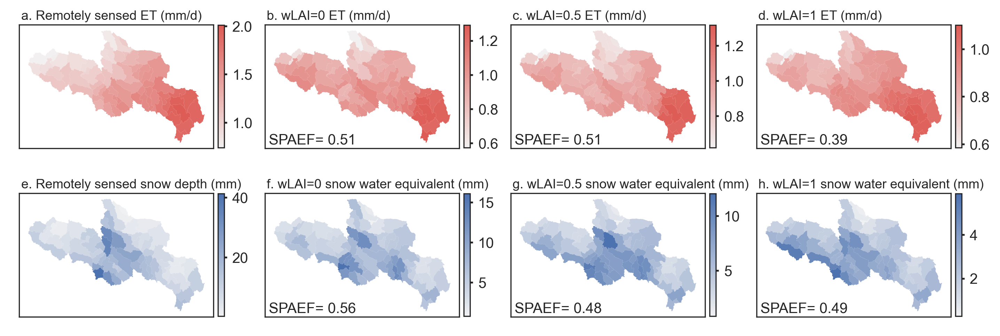

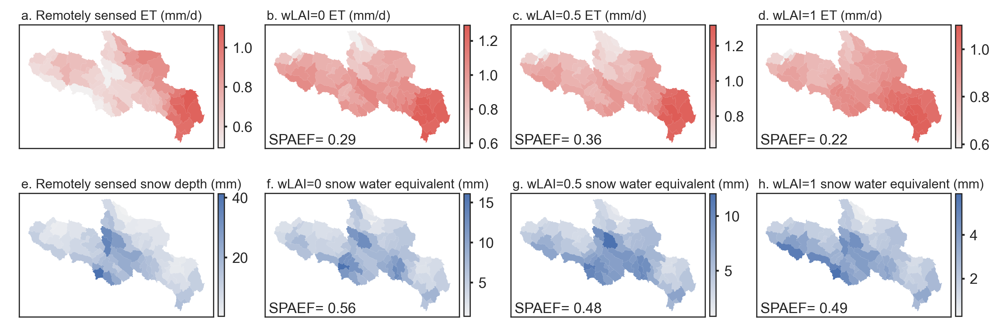

In [31]:
def plotEtSdMap(valData, simulation, cmaps, basinFile, figSize=(12, 4), ET_type='GLEAM', savePath=None):
    models = ['wLAI=0', 'wLAI=0.5', 'wLAI=1']
    plt.rcParams['font.family'] = 'Arial'
    sns.set(style='ticks')
    basins = gpd.read_file(basinFile)
    metricUnit = dict(zip(['ET', 'Snow depth'], ['(mm/d)', '(mm)']))
    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=figSize, dpi=300)
    for i, var in enumerate(['ET', 'Snow depth']):
        # calculate data to plot
        if var == 'ET':
            df = pd.DataFrame(columns=['Observed'] + models, index=range(0, 69))
            df.loc[:, 'Observed'] = valData[models[0]][f'{ET_type}Et'].groupby(valData[models[0]][f'{ET_type}Et'].index.year).mean().mean(axis=0).values
            for model in models:
                df.loc[:, model] = simulation[model]['mean']['E'].groupby(simulation[model]['mean']['E'].index.year).mean().mean(axis=0)
        else:
            df = pd.DataFrame(columns=['Observed'] + models, index=range(0, 69))
            df.loc[:, 'Observed'] = valData[models[0]]['snowDepth'].groupby(valData[models[0]]['snowDepth'].index.year).mean().mean(axis=0).values
            for model in models:
                df.loc[:, model] = simulation[model]['mean']['Sw'].groupby(simulation[model]['mean']['Sw'].index.year).mean().mean(axis=0)
        for j, item in enumerate(['Observed'] + models):
            cmap = sns.color_palette(cmaps[i], as_cmap=True)
            ax = axes[i, j]
            dfPlot = pd.concat([basins, df], axis=1)
            vmin, vmax = df.loc[:, item].values.min(), df.loc[:, item].values.max()
            dfPlot.plot(column=item, ax=ax, cmap=cmap, edgecolor='None', linewidth=0.1, vmin=vmin, vmax=vmax)
            ax.set_xticks([])
            ax.set_yticks([])

            # Set axis spines properties
            lw = 0.8
            ax.spines['top'].set_linewidth(lw)  # Top spine thickness
            ax.spines['bottom'].set_linewidth(lw)  # Bottom spine thickness
            ax.spines['left'].set_linewidth(lw)  # Left spine thickness
            ax.spines['right'].set_linewidth(lw)  # Right spine thickness

            txtDict = {'ET': 'ET', 'Snow depth': 'snow water equivalent'}
            if item in models:
                text = f'{item} {txtDict[var]} {metricUnit[var]}'
            else:
                text = 'Remotely sensed ET (mm/d)' if var == 'ET' else 'Remotely sensed snow depth (mm)'

            ax.annotate(f'{chr(97+i*4+j)}. {text}', xy=(0.01, 1.04), xycoords='axes fraction', fontsize=9)
            # calculate spatial similarity
            if item in models:
                obs, sim = df.loc[:, 'Observed'].values , df.loc[:, item].values
                alpha = np.corrcoef(obs, sim)[0, 1]
                beta = variation(sim) / variation(obs)
                bins = int(np.around(math.sqrt(len(obs)), 0))
                hobs, _ = np.histogram(zscore(obs),bins)
                hsim, _ = np.histogram(zscore(sim),bins)
                gamma = np.minimum(hobs, hsim).sum() / hobs.sum()
                spaEF = 1 - np.sqrt((alpha - 1) ** 2 + (beta - 1) ** 2 + (gamma - 1) ** 2)

                ax.annotate(f'SPAEF={spaEF: .2f}', xy=(0.02, 0.03), xycoords='axes fraction', fontsize=10)
            norm = cm.Normalize(vmin=vmin, vmax=vmax)
            sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
            cbar = plt.colorbar(sm, ax=ax, orientation='vertical', shrink=0.8, pad=0.02)
            cbar.ax.tick_params(direction='out', length=2, labelsize=10)
            cbar.outline.set_linewidth(lw)

    plt.subplots_adjust(wspace=0.05, hspace=0.1)
    # plt.tight_layout()
    if savePath is not None:
        plt.savefig(savePath)
    plt.show()

plotEtSdMap(valData=valData, simulation=simulation, cmaps=['light:#DE5C56', 'light:b'], basinFile='../data/sub-basins/watershed.shp')

### Plot soil water dynamics.

In [26]:
from typing import Union, List
import geopandas as gpd
from matplotlib import colors as cm

def plotSoilMap(sim, model, cmap, basinFile, tRange: Union[None, List[str]] = None, figSize=(10, 2.5), savePath=None, fmt='pdf'):
    import warnings
    warnings.filterwarnings('ignore')  # ignore the warning of plt.tight_layout()
    plt.rcParams['font.family'] = 'Arial'
    sns.set(style='ticks')
    if tRange is None:
        tRange = ['2000-1-1', '2019-12-31']
    tRange = pd.date_range(tRange[0], tRange[1])
    basins = gpd.read_file(basinFile)

    # calculate monthly mean soil water
    dfTempSolid = sim[model]['mean']['Sss'][sim[model]['mean']['Sss'].index.isin(tRange)]
    dfTempLiquid =  sim[model]['mean']['Ssl'][sim[model]['mean']['Ssl'].index.isin(tRange)]
    dfMeanSolid = dfTempSolid.groupby(dfTempSolid.index.month).mean().T
    dfMeanLiquid = dfTempLiquid.groupby(dfTempLiquid.index.month).mean().T
    dfMean = {'Sss': dfMeanSolid, 'Ssl': dfMeanLiquid}

    # get a month dict for annotation
    monDict = {1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun', 7: 'Jul', 8: 'Aug', 9: 'Sep',
               10: 'Oct', 11: 'Nov', 12: 'Dec'}

    # set color bar annotation
    labelDict = {'Sss': 'Frozen water (mm)', 'Ssl': 'Unfrozen water (mm)'}
    vMin, vMax = 9999, -9999
    for var in ['Ssl', 'Sss']:
        dfPlot = pd.concat([basins, dfMean[var]], axis=1)
        fig, axes = plt.subplots(nrows=2, ncols=6, figsize=figSize, dpi=300)
        cbarAx = fig.add_axes([0.907, 0.168, 0.007, 0.658])  # left, bottom, width, height
        # Normalize the colormap to the data range
        vMin = dfPlot[range(1, 13)].min().min() if dfPlot[range(1, 13)].min().min() < vMin else vMin
        vMax = dfPlot[range(1, 13)].max().max() if dfPlot[range(1, 13)].max().max() > vMax else vMax
        for month in range(1, 13):
            axRow, axCol = int((month - 1) / 6), (month - 1) % 6
            ax = axes[axRow, axCol]
            dfPlot.plot(column=month, ax=ax, cmap=cmap, edgecolor='None', linewidth=0.1)
            ax.annotate(monDict[month], xy=(0.03, 0.05), xycoords='axes fraction', fontsize=10)
            ax.set_xticks([])
            ax.set_yticks([])

            # Set axis spines properties
            lw = 0.8
            ax.spines['top'].set_linewidth(lw)  # Top spine thickness
            ax.spines['bottom'].set_linewidth(lw)  # Bottom spine thickness
            ax.spines['left'].set_linewidth(lw)  # Left spine thickness
            ax.spines['right'].set_linewidth(lw)  # Right spine thickness

            # # Set axis spines colors with transparency
            # color = (0, 0, 0, 0.7)
            # ax.spines['top'].set_color(color)
            # ax.spines['bottom'].set_color(color)
            # ax.spines['left'].set_color(color)
            # ax.spines['right'].set_color(color)

        # add a color bar for all axes
        norm = cm.Normalize(vmin=vMin, vmax=vMax)
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        cbar = plt.colorbar(sm, cax=cbarAx, orientation='vertical')

        cbar.ax.set_ylabel(labelDict[var], fontsize=10)
        cbar.ax.tick_params(direction='out', length=2, labelsize=10)
        cbar.outline.set_linewidth(lw)

        # plt.tight_layout(rect=[0, 0, 0.95, 1])  # left, bottom, right, top
        plt.subplots_adjust(wspace=0.1, hspace=-0.15)
        if savePath is not None:
            plt.savefig(os.path.join(savePath, f'{var}.{fmt}'))
        plt.show()

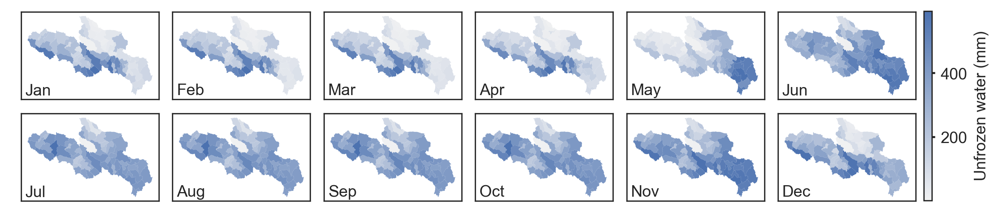

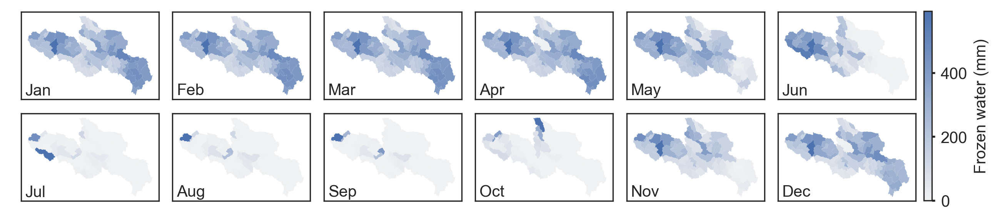

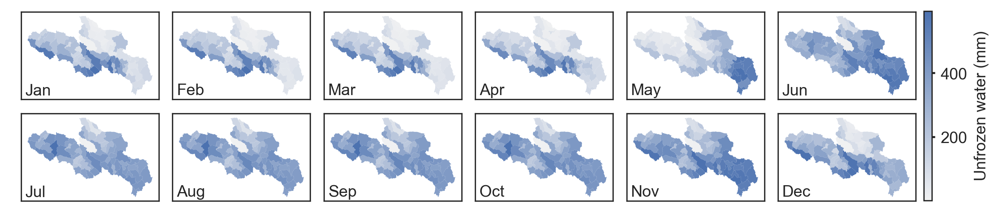

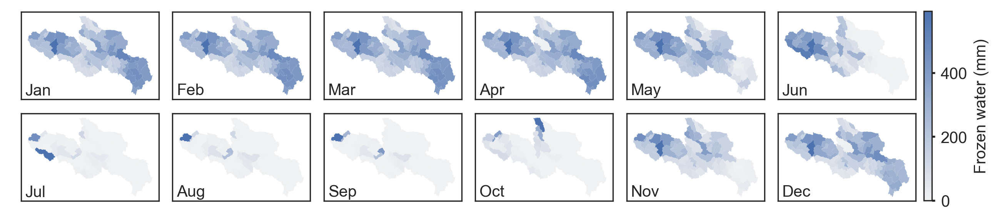

In [27]:
cMap = sns.color_palette('light:b', as_cmap=True)
plotSoilMap(simulation, model='wLAI=0', cmap=cMap, basinFile='../data/sub-basins/watershed.shp', figSize=(10, 2.5), savePath=rootDir)

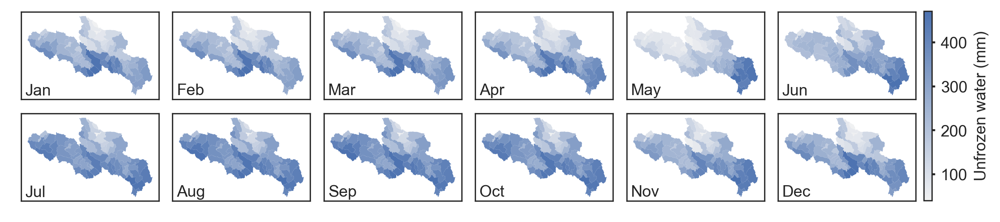

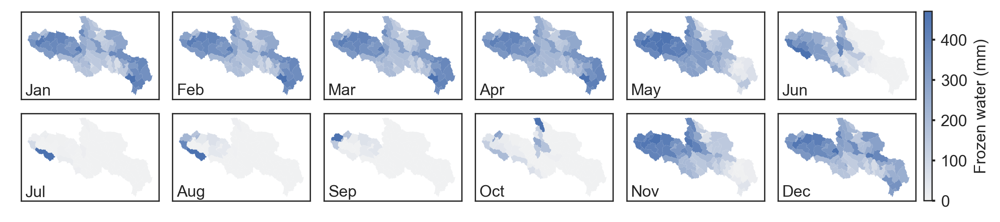

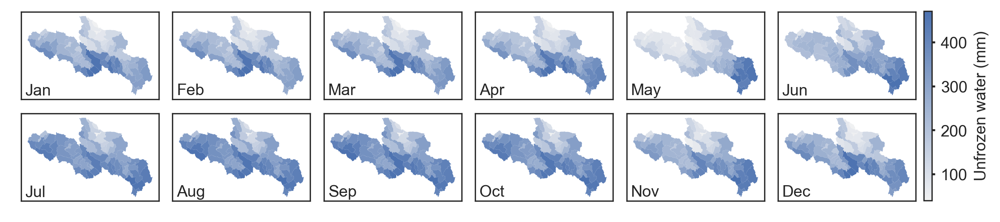

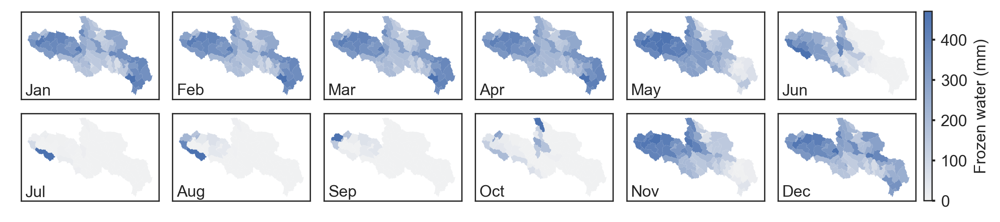

In [28]:
plotSoilMap(simulation, model='wLAI=0.5', cmap=cMap, basinFile='../data/sub-basins/watershed.shp', figSize=(10, 2.5), savePath=rootDir)

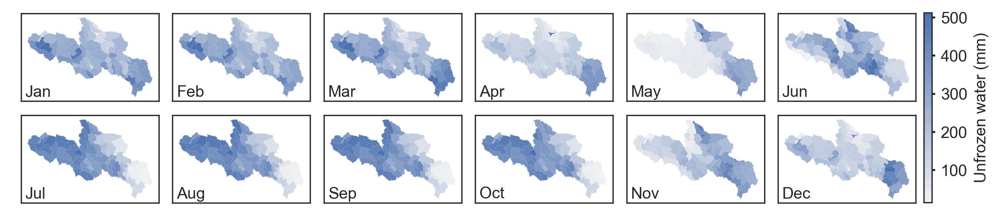

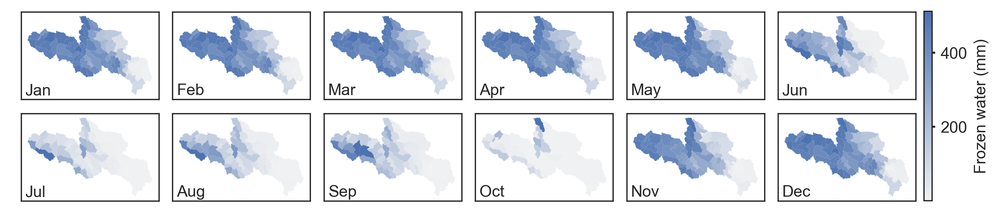

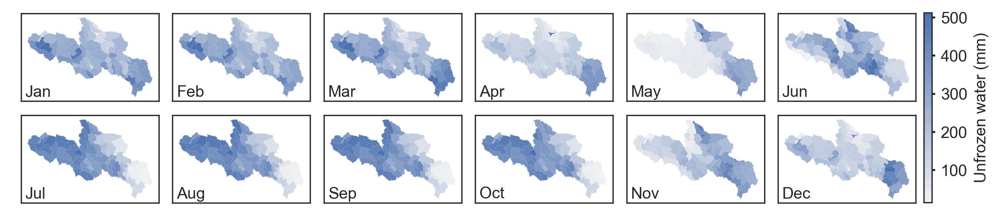

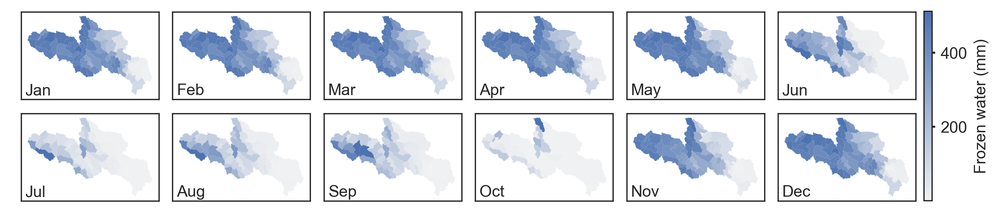

In [29]:
plotSoilMap(simulation, model='wLAI=1', cmap=cMap, basinFile='../data/sub-basins/watershed.shp', figSize=(10, 2.5), savePath=rootDir)

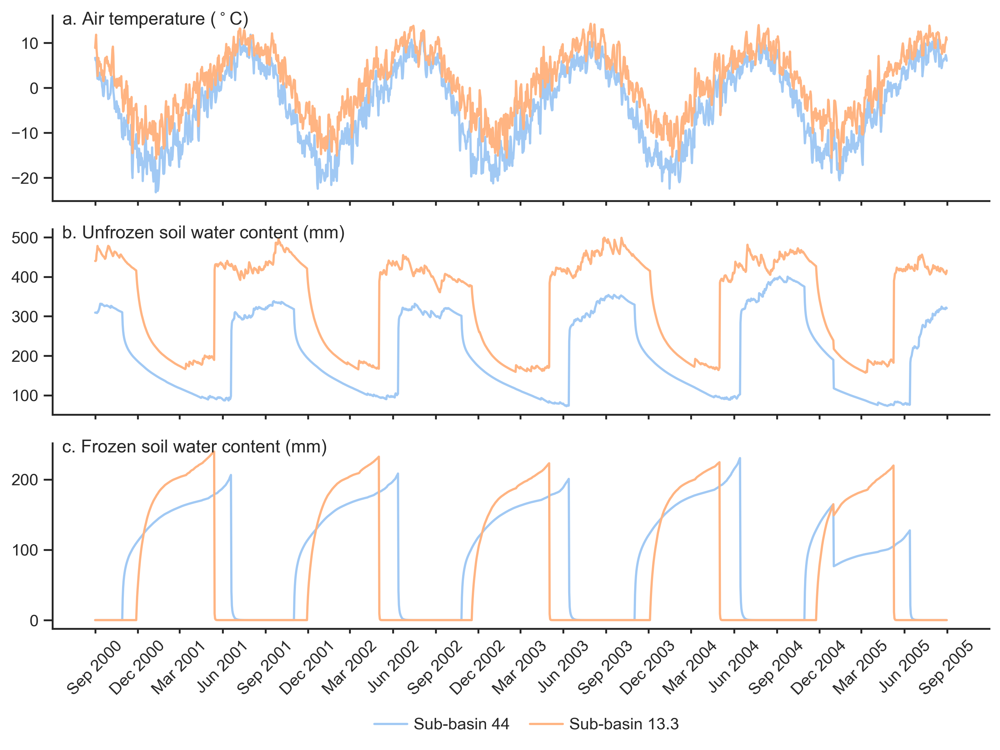

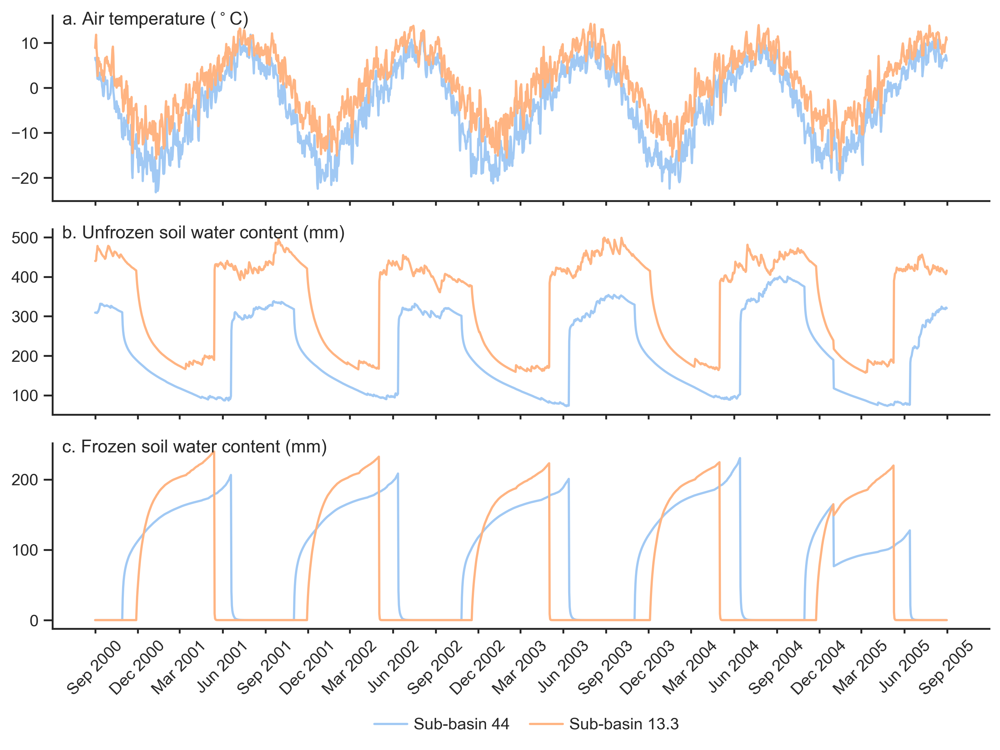

In [30]:
basinFile = '../data/sub-basins/watershed.shp'
forcFile = '../data/data.pkl'
basinCodes = [44, 13.3]
tRange = ['2000-9-1', '2005-8-31']
model = 'wLAI=0.5'

import pickle
import matplotlib.dates as mdates
tRange = pd.date_range(tRange[0], tRange[1])
txtDict = dict(zip(['tas', 'Ssl', 'Sss'], ['Air temperature ($^\circ$C)', 'Unfrozen soil water content (mm)', 'Frozen soil water content (mm)']))
dataPlot = {}
for code in basinCodes:
    dataPlot[code] = pd.DataFrame(index=tRange, columns=['tas', 'Sss', 'Ssl'])

basins = gpd.read_file(basinFile)
colors = sns.color_palette('pastel', n_colors=len(basinCodes))
with open(forcFile, 'rb') as f:
    input = pickle.load(f)
    for code in basinCodes:
        id = basins[basins['Code'] == str(code)].index.tolist()[0]
        forcing = input['basin_forcing_attr'][f'basin_{id}']['forcing']
        dataPlot[code].loc[:, 'tas'] = forcing[forcing.index.isin(tRange)].loc[:, 'tas'].values
        Ssl, Sss = simulation[model]['mean']['Ssl'], simulation[model]['mean']['Sss']
        dataPlot[code].loc[:, 'Ssl'] = Ssl[Ssl.index.isin(tRange)].loc[:, id].values
        dataPlot[code].loc[:, 'Sss'] = Sss[Sss.index.isin(tRange)].loc[:, id].values
        # dataPlot[code] = dataPlot[code].resample('M').mean()

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 7), dpi=300)
for i, var in enumerate(txtDict.keys()):
    ax = axes[i]
    for j, code in enumerate(basinCodes):
        ax.plot(dataPlot[code][var], linewidth=1.5, color=colors[j], label=f'Sub-basin {code}')
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    dateFmt = mdates.DateFormatter('%b %Y')
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
    ax.tick_params(rotation=45, axis='x', length=3)
    ax.xaxis.set_major_formatter(dateFmt)
    if i < 2:
        ax.set_xticklabels([])
    ax.annotate(f'{chr(97 + i)}. {txtDict[var]}', xy=(0.01, 0.95), xycoords='axes fraction')

lines, labels = axes[-1].get_legend_handles_labels()
fig.legend(lines[:6], labels[:6], ncol=6, borderaxespad=0.1,
           bbox_to_anchor=(0.35, 0.02, 0.3, 0.02), mode='expand', columnspacing=1, frameon=False, handletextpad=0.4)
fig.tight_layout(rect=[0, 0.03, 0.95, 1])
